# Utility Methods

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pickle
import glob
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

def show_images(images, per_row=2, titles=None, main_title=None, cmap=None, figsize=(48,18)):
    figure = plt.figure(1)
    for n, img in enumerate(images):
        columns = int(np.ceil(len(images) / per_row))
        ax = figure.add_subplot(columns, per_row, n + 1)

        
        ax.grid(False)
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_xticks([])
        ax.set_yticks([])

        if (titles is not None and len(titles) >= n):
            ax.set_title(titles[n])
        
        if cmap is None:
            ax.imshow(img)
        else:
            ax.imshow(img, cmap=cmap)
    if main_title is not None:
        plt.suptitle(main_title)
        
    figure.tight_layout()
    plt.show()    
    
def combine_images(img1, img2, padding=0):
    """
    Combines two images side-by-side.
    """
    height1,width1 = img1.shape[:2]
    height2,width2 = img2.shape[:2]

    new_width = width1+width2+padding
    new_height = np.max([height1, height2])

    combined_img = np.zeros(shape=(new_height, new_width, 3), dtype=np.uint8)
    combined_img[:height1,:width1]=img1
    combined_img[:height2,width1+padding:new_width]=img2
    return combined_img

def scale_to_uint8(arr):
    '''Rescales array to uint8'''
    scale_factor = np.max(arr) / 255
    return (arr / scale_factor).astype(np.uint8)


def binary_encode(grad, min_thresh, max_thresh):
    '''Encodes a 1 for values in the array that fall within threshold, 0 everywhere else'''
    binary_output = np.zeros_like(grad)
    binary_output[(grad >= min_thresh) & (grad <= max_thresh)] = 1
    return binary_output

def y_linespace(img):
    img_height = img.shape[0]
    return np.linspace(0, img_height-1, img_height)


# Camera Calibration

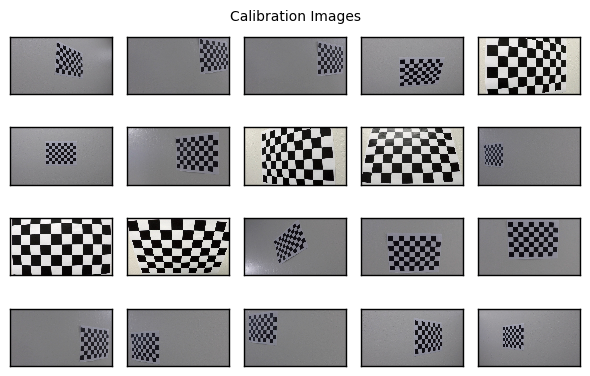

In [2]:

def load_camera_calibration_images():
    '''Loads the 20 camera calibration images'''
    
    imgs = {}
    directory = "camera_cal/"
    for i in range(1,21):
        filename = "calibration"+ str(i) + ".jpg"
        img = cv2.imread(directory + filename)
        imgs[filename] = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
    return imgs
    
calibration_imgs = load_camera_calibration_images()
corner_counts = (9, 6) # inside corners in row, column

show_images(calibration_imgs.values(), per_row=5, main_title="Calibration Images")

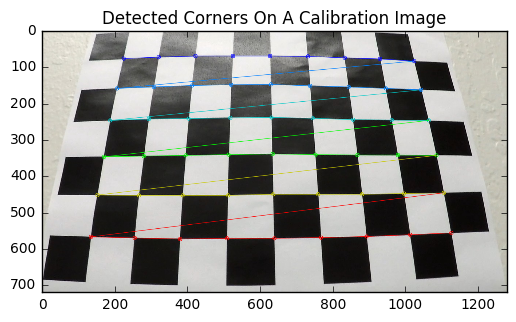

In [3]:
def find_and_show_corners(img, corner_counts):
    '''Finds corners in chessboard image and draws them on image'''
    new_img = np.copy(img)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    ret, corners = cv2.findChessboardCorners(gray,corner_counts, None)
    if ret == True:
        cv2.drawChessboardCorners(new_img, corner_counts, corners, ret)
        
    return new_img

# show calibration image with corners detected
img = find_and_show_corners(calibration_imgs['calibration3.jpg'], corner_counts)
plt.imshow(img)
plt.title("Detected Corners On A Calibration Image")
plt.show()

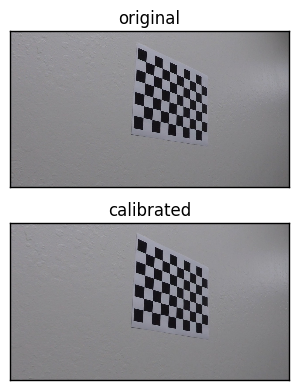

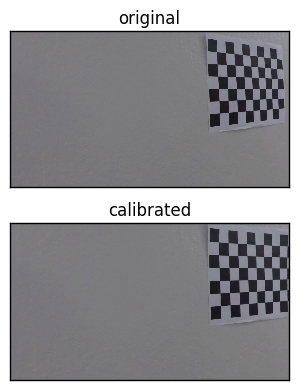

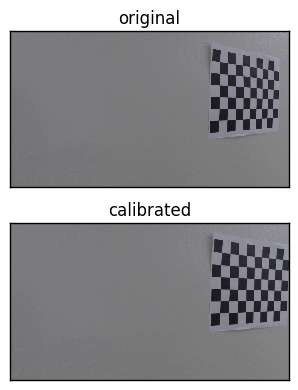

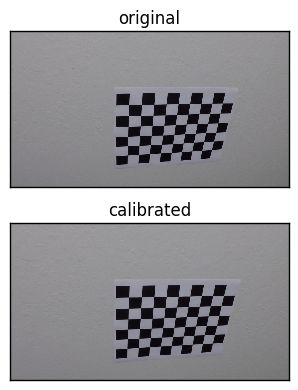

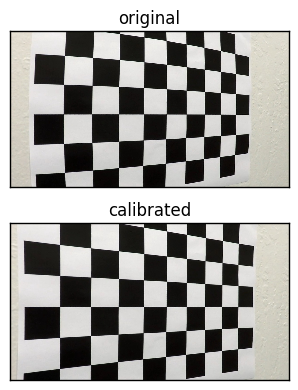

...

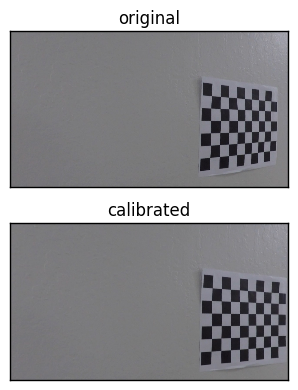

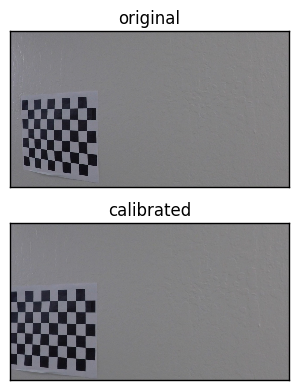

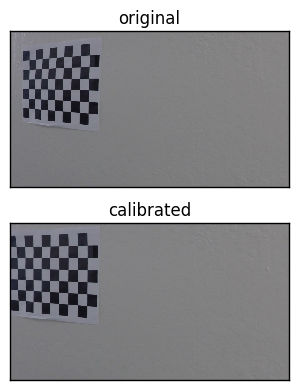

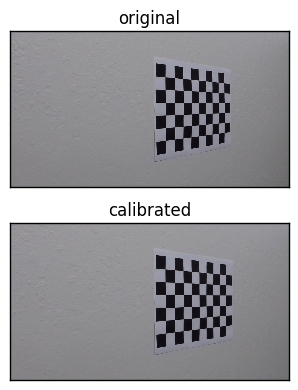

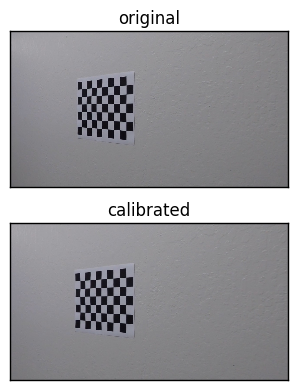

In [4]:
def calibrate_camera(calibration_imgs, corner_counts, use_pickle=True):
    '''Calibrate camera using calibration images or pickle file'''
    pickle_filename = 'camera_calibration.p'
    
     # use pickeled file, if it exists
    if use_pickle:
        try:
            saved_calibration = pickle.load(open(pickle_filename, 'rb'))
            return saved_calibration['mtx'], saved_calibration['dist']
        except(OSError, IOError) as e:
            print("Failed to open saved camera calibration...recalibrating")
        
    # Arrays to store points from all images
    object_pts = [] # Store 3D points for real world space
    image_pts = [] # 2D points from the image

    gray = None
    corner_find_fails = 0
    
    nx = corner_counts[0]
    ny = corner_counts[1]
        
    for calibration_img in calibration_imgs:
        # prepare object points
        obj_pts = np.zeros((nx*ny, 3), np.float32)
        obj_pts[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

        # get grayscale image to extract corners
        gray = cv2.cvtColor(calibration_img, cv2.COLOR_RGB2GRAY)

        # find corners
        found, corners = cv2.findChessboardCorners(gray, corner_counts, None)

        # if corners found, add to object points and image points
        if found == True:
            image_pts.append(corners)
            object_pts.append(obj_pts)
        else:
            corner_find_fails += 1

    if(corner_find_fails > 0):
        print("Failed to find corners on", corner_find_fails, "images.")

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_pts, image_pts, gray.shape[::-1], None,None)
    
    # save calibration to pickle file
    with open(pickle_filename, 'wb') as file:
        pickle.dump({'mtx': mtx, 'dist': dist},file)
                    
    return mtx, dist

def undistort(img):
    mtx,dist=calibrate_camera(calibration_imgs, corner_counts)
    return cv2.undistort(img, mtx,dist, None, mtx)

camera_mtx, camera_dist = calibrate_camera(list(calibration_imgs.values()), corner_counts)

# calibrated_img = cv2.undistort(img, mtx,dist, None, mtx)
# show original versus calibrated images
for key, img in calibration_imgs.items():
    corrected_img = undistort(img)
    cv2.imwrite('output_images/camera_cal/calibrated_'+key, corrected_img)
    show_images([img, corrected_img], titles=["original", "calibrated"], per_row=1)


In [5]:
def load_and_undistort(img_path):
    '''Loads and undistorts an image at provided path according to predetermined camera calibration matrix'''
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return undistort(img)

def load_test_images():
    test_img_filenames = glob.glob('test_images/*.jpg')
    rgb_images = []

    for filename in test_img_filenames:
        img = cv2.imread(filename)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        rgb_images.append(undistort(img))
    
    return rgb_images


# Gradients

In [6]:
def to_single_channel_img(img):
    if len(img.shape) > 2 and img.shape[2] > 1:
        return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        return img
    

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    '''Calculates the directional gradient and returns a binary encoded result for the given threshold'''
    image = to_single_channel_img(img)

    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    else:
        abs_sobel = np.absolute(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel))

    abs_sobel = scale_to_uint8(abs_sobel)

    return binary_encode(abs_sobel, thresh[0], thresh[1])

def mag_threshold(image, sobel_kernel=3, thresh=(0, 255)):
    '''Calculates the gradient magnitude and returns a binary encoded result for the given threshold'''
    image = to_single_channel_img(img)

    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    gradient_magnitude = np.sqrt(np.square(sobelx) + np.square(sobely))
    gradient_magnitude = scale_to_uint8(gradient_magnitude)

    return binary_encode(gradient_magnitude, thresh[0], thresh[1])


def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi / 2)):
    '''Calculates the gradient direction and returns a binary encoded result for the given threshold'''
    image = to_single_channel_img(img)

    abs_sobelx = np.absolute(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    abs_sobely = np.absolute(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=sobel_kernel))

    absgraddir = np.arctan2(abs_sobely, abs_sobelx)
    return binary_encode(absgraddir, thresh[0], thresh[1])


# Thresholding

In [8]:

def threshold_pipeline(img, s_thresh=(210,255),  s_channel=2,
                       sx_thresh=(40,105), sy_thresh=(30,100), sx_channel=1, sx_kernel=15,
                       dir_thresh=(0.8,1.1), dir_kernel=15,
                       mag_thresh=(45,105), mag_kernel=9):
# def threshold_pipeline(img, s_thresh=(210,255), l_thresh=(30,255),  s_channel=2,
#                        sx_thresh=(20,255), sy_thresh=(30,155), sx_channel=2, sx_kernel=5,
#                        dir_thresh=(0.8,1.1), dir_kernel=5,
#                        mag_thresh=(45,125), mag_kernel=5):

#     img = np.copy(img)
#     hls_img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)

#     sx_img = hls_img[:,:,sx_channel]
#     s_img = hls_img[:,:,s_channel]
#     sat_img = hls_img[:,:,2]


#     sxbinary = abs_sobel_thresh(sx_img, thresh=sx_thresh, sobel_kernel=sx_kernel, orient='x')
#     sybinary = abs_sobel_thresh(sx_img, thresh=sy_thresh, sobel_kernel=sx_kernel, orient='y')

#     # binary encode color channel according to threshold
#     s_binary = binary_encode(s_img, min_thresh=s_thresh[0], max_thresh=s_thresh[1])
#     l_binary = binary_encode(l_img, min_thresh=l_thresh[0], max_thresh=l_thresh[1])
    
#     dir_binary = dir_threshold(sat_img, sobel_kernel=dir_kernel, thresh=dir_thresh)
#     mag_binary = mag_threshold(sat_img, sobel_kernel=mag_kernel, thresh=mag_thresh)
    
#     combined = np.zeros_like(sxbinary)
#     combined[((sxbinary == 1) & (sybinary == 1)) | ((dir_binary == 1) & (mag_binary == 1)) | ((s_binary == 1)] = 1
#     return combined

# test_imgs = load_test_images()
# for img in test_imgs:
#     current = threshold_pipeline(img, s_thresh=(210,255), s_channel=2,
#                                  sx_thresh=(45,105), sx_channel=2, sx_kernel=15,
#                                 dir_thresh=(0.8,1.1), dir_kernel=15,
#                                 mag_thresh=(45,105))
    
#     prev = threshold_pipeline(img, s_thresh=(210,255), s_channel=2,
#                                  sx_thresh=(40,110), sx_channel=2, sx_kernel=15)
    
#     show_images(images=[current, img], titles=['threshold','orig'], per_row=2, cmap='gray')
    
    



SyntaxError: unexpected EOF while parsing (<ipython-input-8-f1e03f10d71f>, line 46)

# Perspective Transform

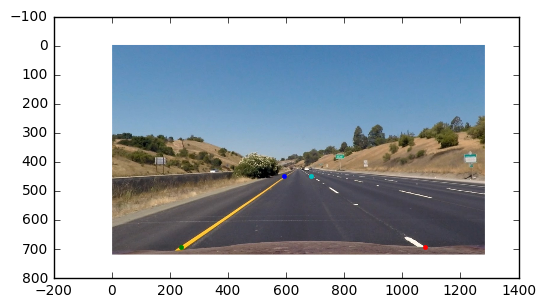

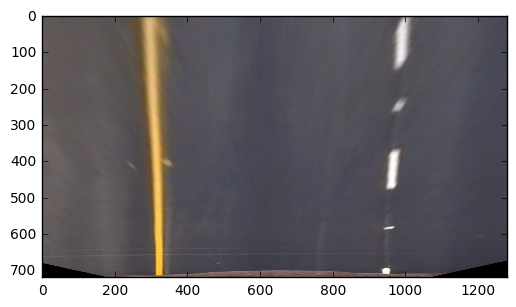

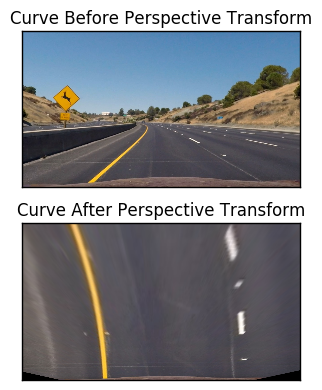

In [20]:
img = cv2.imread('test_images/straight_lines1.jpg')
img = undistort(img)


def perspective_warp(img):
    '''Warps image using src, dest points to perform the transform'''
    img_size = (img.shape[1], img.shape[0])
   
    src = np.float32(
    [[586,460],
    [203,720],
    [1127, 720],
    [695, 460]]
    )
        
    dest = np.float32(
    [[320 ,0],
     [320,720],
     [960, 720],
     [960,0]
    ])
    
    M = cv2.getPerspectiveTransform(src,dest)
    
    Minv = cv2.getPerspectiveTransform(dest,src)
    
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, Minv

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.plot(593,448,".") 
plt.plot(240,692,".")
plt.plot(1077,692,".") 
plt.plot(686,448,".")
plt.show()

plt.imshow(perspective_warp(img)[0])
plt.show()

test2 = load_and_undistort('test_images/test2.jpg')
warped_test2 = perspective_warp(test2)[0]

show_images([test2, warped_test2], per_row=1, 
            titles=["Curve Before Perspective Transform","Curve After Perspective Transform"])

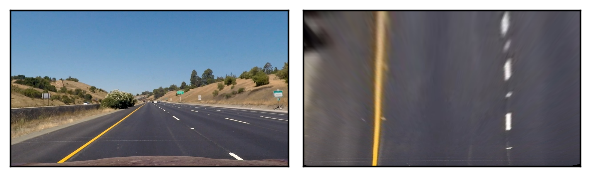

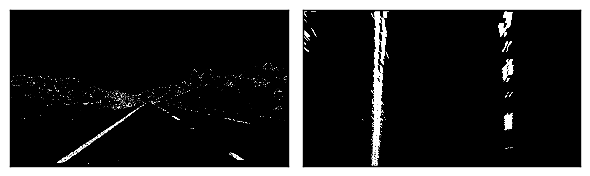

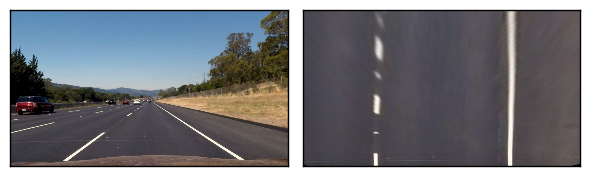

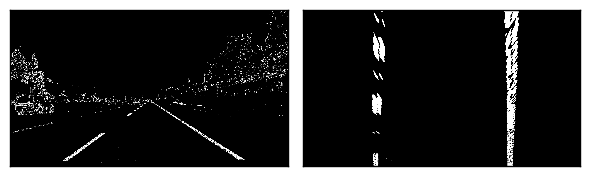

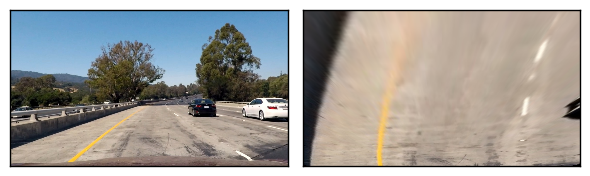

...

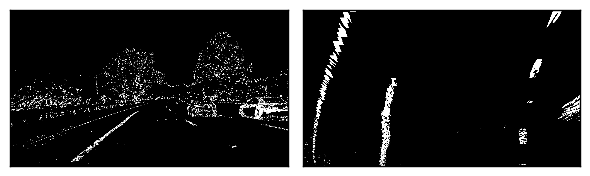

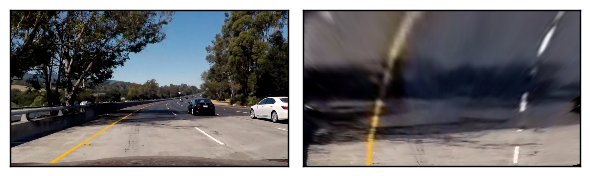

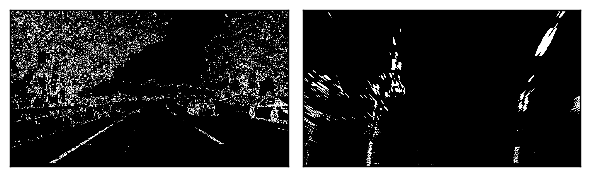

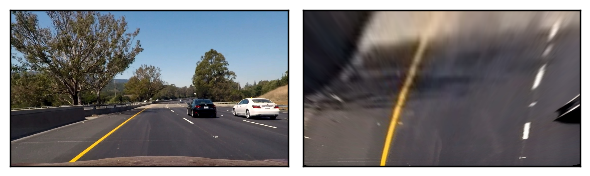

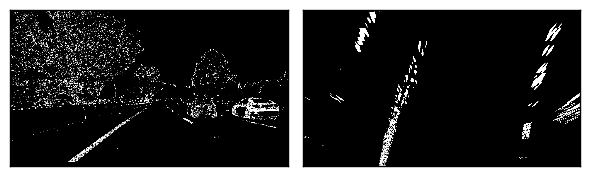

In [17]:
# testing
def threshold_pipeline(img, s_thresh=(160, 255), l_thresh=(40, 255), 
                       sobelx_thresh_l=(35, 255), sobelx_thresh_s=(40,255), sobel_kernel=3,
                      dir_thresh=(0.5,1.58), mag_kernel=3):
    copy_img = np.copy(img)

    # use hls colorspace
    hls = cv2.cvtColor(copy_img, cv2.COLOR_RGB2HLS)

    l_channel = hls[:, :, 1]
    s_channel = hls[:, :, 2]

    # apply threshold to sobel x
    sobel_x_binary_l = abs_sobel_thresh(l_channel, thresh=sobelx_thresh_l, sobel_kernel=sobel_kernel, orient='x')
    sobel_x_binary_s = abs_sobel_thresh(s_channel, thresh=sobelx_thresh_s, sobel_kernel=sobel_kernel, orient='x')
    
    # apply directional threshold
    dir_binary = dir_threshold(s_channel, sobel_kernel=mag_kernel, thresh=dir_thresh)

    # apply threshold to s and l color channels
    s_binary = binary_encode(s_channel, min_thresh=s_thresh[0], max_thresh=s_thresh[1])
    l_binary = binary_encode(l_channel, min_thresh=l_thresh[0], max_thresh=l_thresh[1])

    # finally, return the combined binary image
    combined = np.zeros_like(sobel_x_binary_s)
    combined[(dir_binary == 1) & ((s_binary == 1) & (l_binary  == 1) | 
                                  ((sobel_x_binary_s == 1) | (sobel_x_binary_l == 1)))] = 1

    return combined

test_imgs = load_test_images()

for image in test_imgs:
    threshold = threshold_pipeline(image)
    
    threshold_warped = perspective_warp(threshold)[0]
    img_warped = perspective_warp(image)[0]
    
    show_images(images=[image, img_warped], per_row=2)
    show_images([threshold, threshold_warped], per_row=2, cmap='gray')
    


# Perspective With Thresholding

# Finding Lines

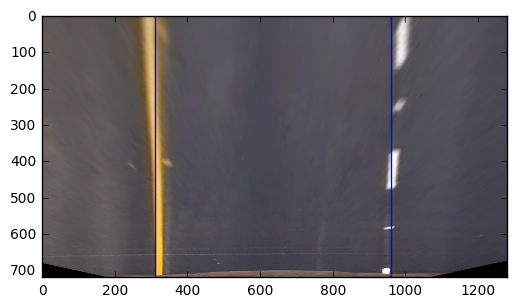

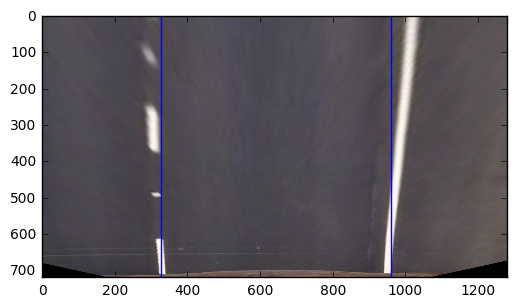

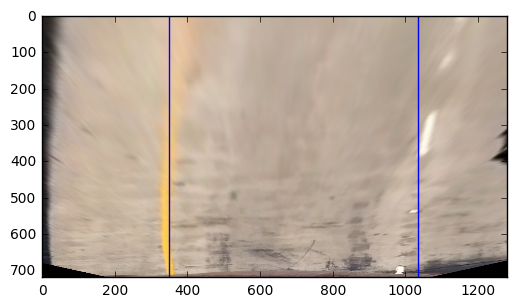

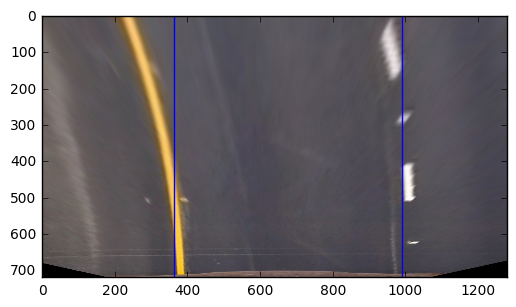

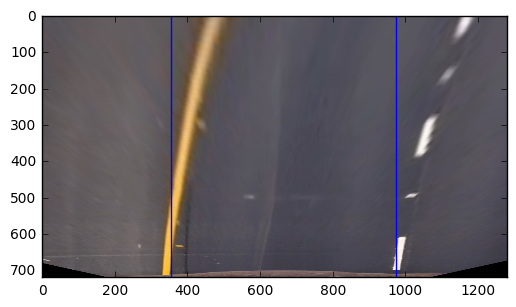

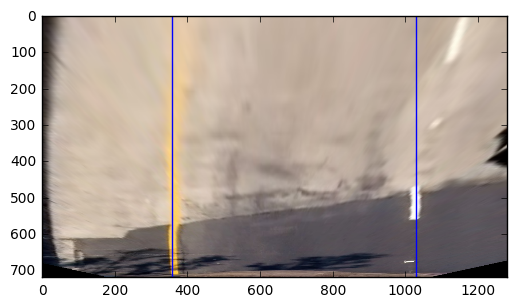

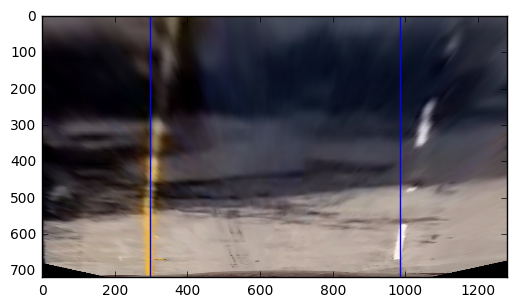

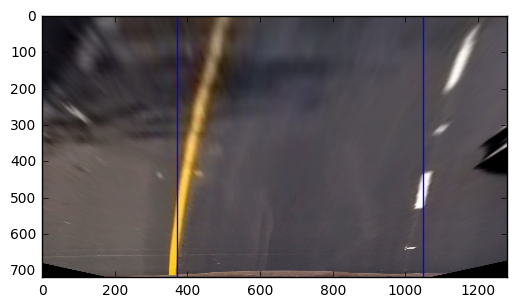

In [11]:
def detect_line_bases(warped_img):
    lower_half = int(warped_img.shape[0]/2)
    histogram = np.sum(warped_img[lower_half:,:], axis=0)
    
    midpoint = np.int(histogram.shape[0]/2)
    left_base = np.argmax(histogram[:midpoint])
    right_base = np.argmax(histogram[midpoint:]) + midpoint
    
    return left_base, right_base

test_imgs = load_test_images()

for image in test_imgs:
    threshold = threshold_pipeline(image)
    warped_img = perspective_warp(threshold)[0]
    
    plt.imshow(perspective_warp(image)[0], cmap='gray')
    left_base, right_base = detect_line_bases(warped_img)
    
    plt.axvline(x=left_base)
    plt.axvline(x=right_base)
    plt.show()

    

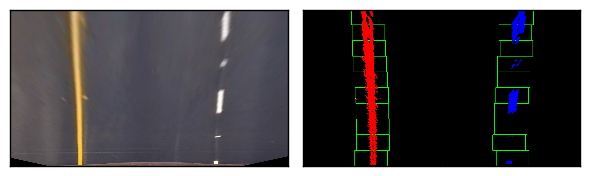

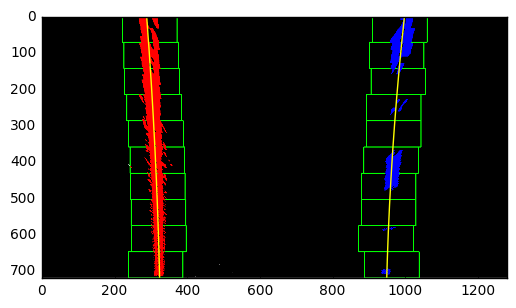

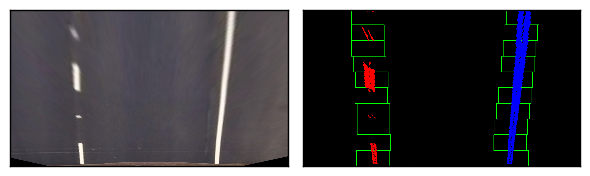

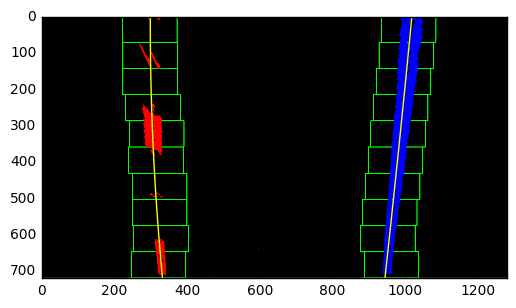

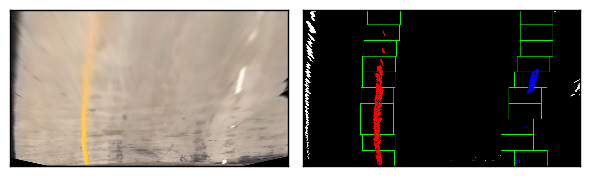

...

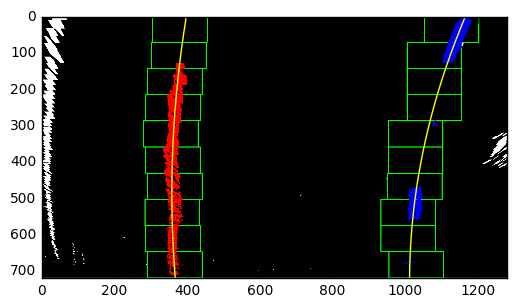

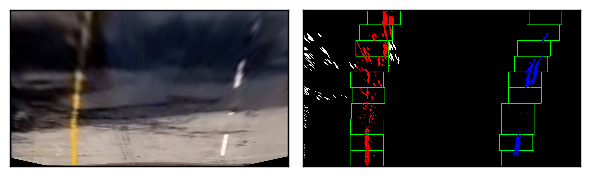

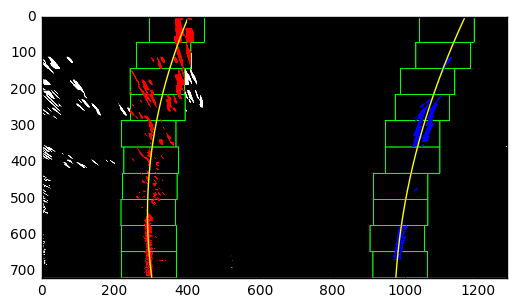

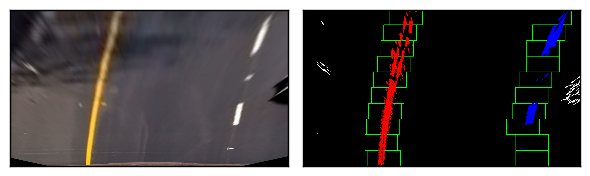

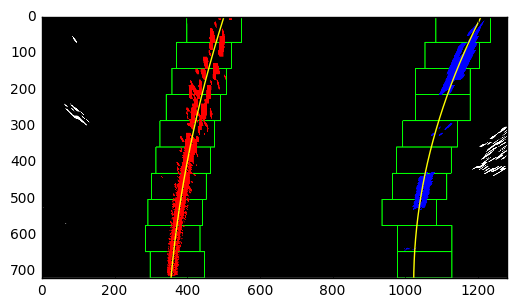

In [12]:
def detect_lanes(warped_img):
    out_img = np.dstack((warped_img, warped_img, warped_img)) * 255
    left_base, right_base = detect_line_bases(warped_img)
    
    window_count = 10
    window_width = 75
    min_pixels_to_recenter = 30
    
    img_height = warped_img.shape[0]
    window_height = np.int(img_height / window_count)
    
    # get x,y position of all nonzero pixels in image
    nonzero = warped_img.nonzero()
    nonzero_x = np.array(nonzero[1])
    nonzero_y = np.array(nonzero[0])
    
    current_left_x = left_base
    current_right_x = right_base
    
    # lists for left/right lane indices
    left_lane_indices = []
    right_lane_indices = []
    
    # iterate through windows
    for window in range(window_count):
        # set boundaries for windows
        window_y_low = img_height - (window+1) * window_height
        window_y_high = img_height - (window * window_height)
        
        window_x_left_low = current_left_x - window_width
        window_x_left_high = current_left_x + window_width
        
        window_x_right_low = current_right_x - window_width
        window_x_right_high = current_right_x + window_width
        
        # draw windows
        out_img = cv2.rectangle(out_img,(window_x_left_low,window_y_low),(window_x_left_high,window_y_high),(0,255,0), 2) 
        out_img = cv2.rectangle(out_img,(window_x_right_low,window_y_low),(window_x_right_high,window_y_high),(0,255,0), 2) 
        
        # get nonzeros within the left and right windows
        nonzeros_in_left_window = ((nonzero_y >= window_y_low) & (nonzero_y < window_y_high) &
                                  (nonzero_x >= window_x_left_low) & (nonzero_x < window_x_left_high)).nonzero()[0]
        
        nonzeros_in_right_window = ((nonzero_y >= window_y_low) & (nonzero_y < window_y_high) &
                                  (nonzero_x >= window_x_right_low) & (nonzero_x < window_x_right_high)).nonzero()[0]
        
        # add indices to lane lists
        left_lane_indices.append(nonzeros_in_left_window)
        right_lane_indices.append(nonzeros_in_right_window)
        
        # recenter if found pixels exceeds threshold
        if len(nonzeros_in_left_window) > min_pixels_to_recenter:
            current_left_x = np.int(np.mean(nonzero_x[nonzeros_in_left_window]))

        if len(nonzeros_in_right_window) > min_pixels_to_recenter:
            current_right_x = np.int(np.mean(nonzero_x[nonzeros_in_right_window]))
        
    left_lane_indices = np.concatenate(left_lane_indices)
    right_lane_indices = np.concatenate(right_lane_indices)
    
    # get left/right lane positions
    leftx = nonzero_x[left_lane_indices]
    lefty = nonzero_y[left_lane_indices]
    rightx = nonzero_x[right_lane_indices]
    righty = nonzero_y[right_lane_indices]
    
    # use second order polynomial to fit each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # draw predicted lane line
    ploty = y_linespace(warped_img)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img[nonzero_y[left_lane_indices], nonzero_x[left_lane_indices]] = [255,0,0]
    out_img[nonzero_y[right_lane_indices], nonzero_x[right_lane_indices]] = [0, 0, 255]

    
    return {
                "squares_img": out_img, 
                "left_fitx": left_fitx, 
                "right_fitx": right_fitx, 
                "left_fit": left_fit,
                "right_fit": right_fit
           }

        
test_imgs = load_test_images()
for img in test_imgs:
    edited_img = threshold_pipeline(img)
    warped = perspective_warp(edited_img)[0]

    ret = detect_lanes(warped)

    squares, left_fitx, right_fitx = ret["squares_img"], ret["left_fitx"], ret["right_fitx"]

    show_images([perspective_warp(img)[0], squares])
    
    plt.imshow(squares)

    ploty = y_linespace(warped)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()
    

# Measuring Lane Curvature And Lane Position

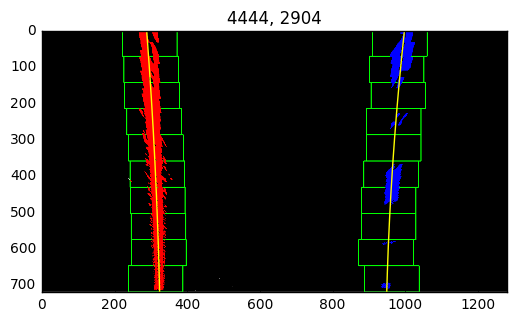

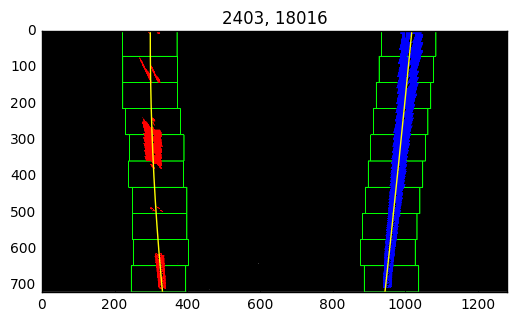

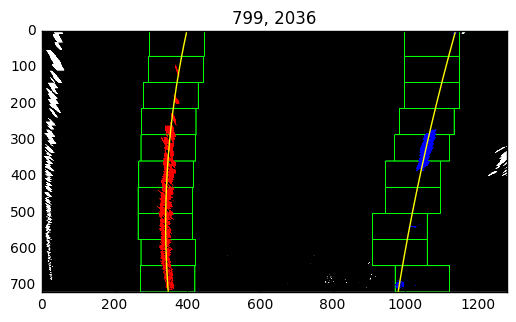

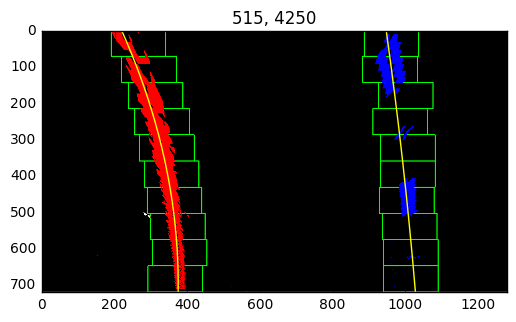

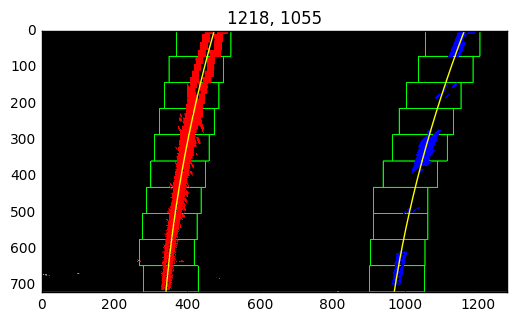

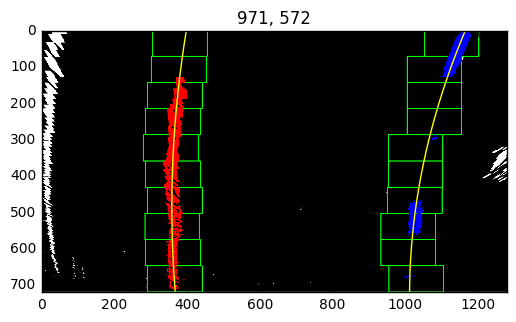

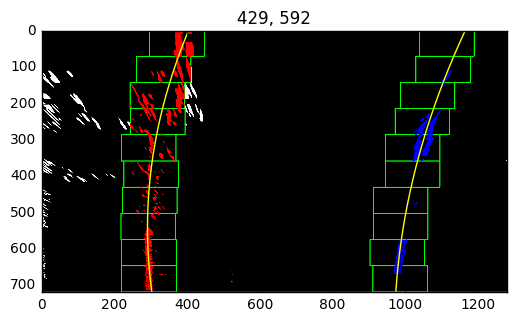

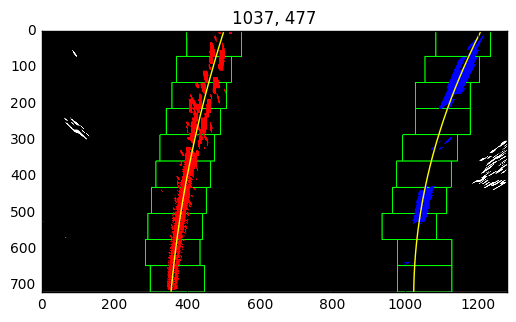

In [39]:
def estimate_lane_curvature(left_fitx, right_fitx, ploty, left_fit, right_fit):
    
    # define radius of curvature at bottom of the image
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

   
    # return radius of curvature is in meters
    return left_curverad, right_curverad

def compute_lane_position(img_shape, left_fit, right_fit):
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # use camera center for car position, assumes camera is mounted in center of car
    car_pos_x = img_shape[1] / 2
    
    lane_left_x, lane_right_x = left_fit[-1], right_fit[-1]
    estimated_lane_center = lane_left_x + (lane_right_x - lane_left_x) / 2 

    return (estimated_lane_center - car_pos_x) * xm_per_pix


test_imgs = load_test_images()

for img in test_imgs:
    threshold_img = threshold_pipeline(img)
    warped_img = perspective_warp(threshold_img)[0]
    
    ret = detect_lanes(warped_img)
    
    ploty = y_linespace(warped_img)
    squares, left_fitx, right_fitx = ret["squares_img"], ret["left_fitx"], ret["right_fitx"]
    left_fit, right_fit = ret['left_fit'], ret['right_fit']
    
    left_curvature, right_curvature = estimate_lane_curvature(left_fitx=ret['left_fitx'],right_fitx=ret['right_fitx'], ploty=ploty,
                           left_fit=ret['left_fit'], right_fit=ret['right_fit'])
    
    plt.title('{0:.0f}, {1:.0f}'.format(left_curvature, right_curvature))
    plt.imshow(squares)
    ploty = y_linespace(warped)
    plt.plot(ret['left_fitx'], ploty, color='yellow')
    plt.plot(ret['right_fitx'], ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    
    plt.show()

# Show Lanes

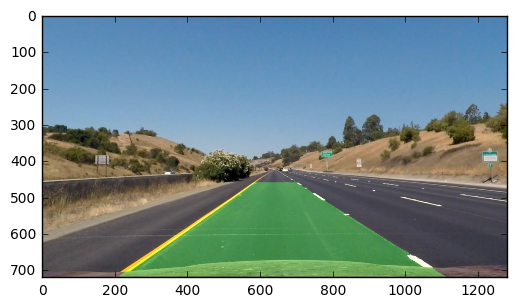

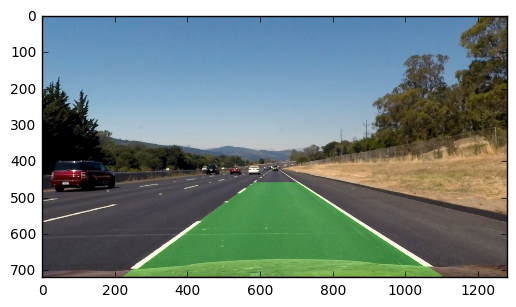

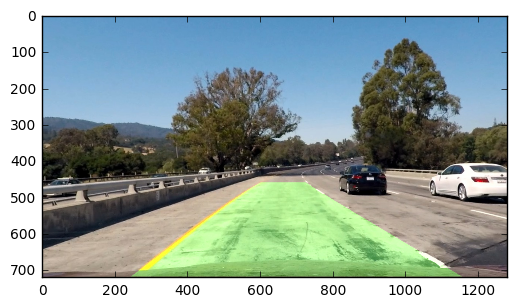

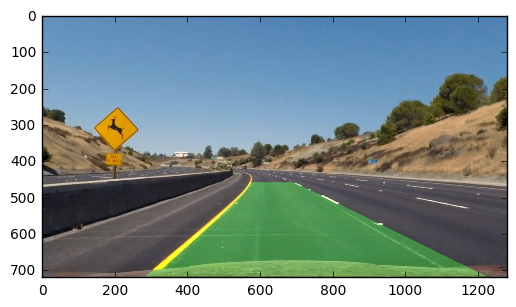

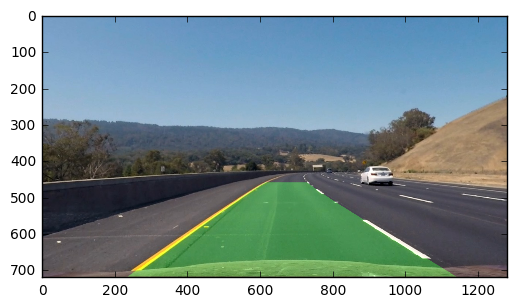

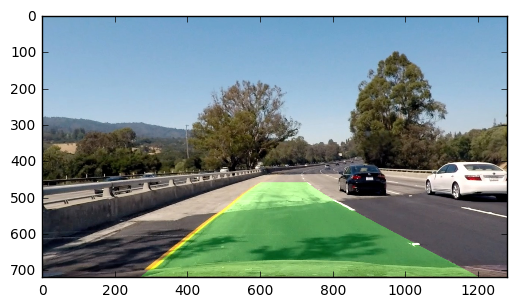

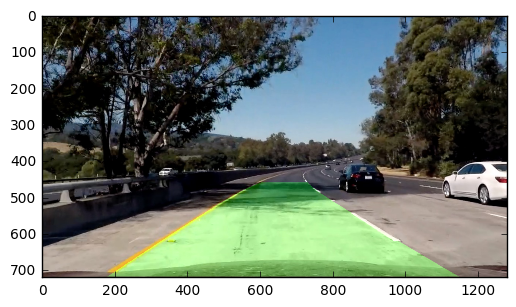

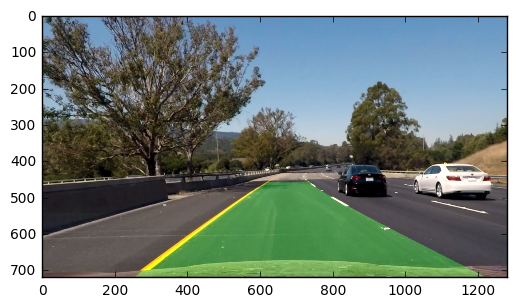

In [14]:
def show_lanes(orig_img, warped_img, Minv, left_fitx, right_fitx):
    ploty = y_linespace(warped_img)
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # recast x,y int format for fillPoly
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
   
    # Combine the result with the original image
    result = cv2.addWeighted(orig_img, 1, newwarp, 0.3, 0)

    return result


test_imgs = load_test_images()

for img in test_imgs:
    threshold_img = threshold_pipeline(img)
    warped_img, M, Minv = perspective_warp(threshold_img)
    
    ret = detect_lanes(warped_img)
    
    final_img = show_lanes(img, warped_img, Minv, ret['left_fitx'], ret['right_fitx'])
    
    plt.imshow(final_img)
    plt.show()
    

In [43]:

last_left_fit = None
last_right_fit = None
running_avg_lane_width = 0
avg_count = 1

def process_image(img):
    global last_left_fit, last_right_fit
    global running_avg_lane_width, avg_count
    text_color = (255,255,255)
    
    undistorted_img = undistort(img)
    threshold_img = threshold_pipeline(undistorted_img)
    warped_img, M, Minv = perspective_warp(threshold_img)
    
    ret = detect_lanes(warped_img)
    
    left_curvature, right_curvature = estimate_lane_curvature(left_fitx=ret['left_fitx'],right_fitx=ret['right_fitx'], ploty=ploty,
                   left_fit=ret['left_fit'], right_fit=ret['right_fit'])
    

    
    curr_left_fit, curr_right_fit = ret['left_fitx'], ret['right_fitx']

    # check for invalid estimates
    invalid_curvature = abs(left_curvature - right_curvature) > 7 * min(left_curvature, right_curvature)
    if invalid_curvature and (last_left_fit is not None and last_right_fit is not None):
        curr_left_fit, curr_right_fit = last_left_fit, last_right_fit
        text_color = (255,0,0)
    
    # if current lane width varies more than 20% from the average, disregard current frame of lane detection
    current_lane_width = np.average(np.abs(curr_left_fit - curr_right_fit))
    lane_width_invalid = avg_count > 1 and \
                    abs(current_lane_width - running_avg_lane_width) > (0.2 * running_avg_lane_width)
    if lane_width_invalid:
        curr_left_fit, curr_right_fit = last_left_fit, last_right_fit
        text_color = (255,0,0)
    else:
        # only update average for new, valid frames
        running_avg_lane_width +=  (current_lane_width - running_avg_lane_width) / avg_count
        avg_count += 1 
    
    last_left_fit, last_right_fit = curr_left_fit, curr_right_fit
    
    final_img = show_lanes(undistorted_img, warped_img, Minv, curr_left_fit, curr_right_fit)
    
    lane_pos = compute_lane_position(warped_img.shape, curr_left_fit, curr_right_fit)
    
    text1 = "curvature left: {0:.0f}, right: {1:.0f}, mid offset: {2:.2f}".format(left_curvature, right_curvature,lane_pos)
    text2 = "lane width: {0:.0f}, avg lane width: {1:.0f}".format(current_lane_width, running_avg_lane_width)
    
    final_img = cv2.putText(final_img, text1, (15,45), cv2.FONT_HERSHEY_COMPLEX, 0.75,text_color,1,cv2.LINE_AA)
    final_img = cv2.putText(final_img, text2, (15,70), cv2.FONT_HERSHEY_COMPLEX, 0.75,text_color,1,cv2.LINE_AA)
    return final_img

# test_imgs = load_test_images()
# for img in test_imgs:
#     img = process_image(img)
#     avg = np.average(np.abs(last_left_fit - last_right_fit))
#     plt.imshow(img)
#     plt.show()

clip1 = VideoFileClip('project_video.mp4')
combined_clip = clip1.fl_image(process_image)
%time combined_clip.write_videofile("combined.mp4", audio=False)


[MoviePy] >>>> Building video combined.mp4
[MoviePy] Writing video combined.mp4



100%|█████████▉| 1260/1261 [04:10<00:00,  5.10it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: combined.mp4 

CPU times: user 4min 45s, sys: 58 s, total: 5min 43s
Wall time: 4min 11s


# Finding Lanes